# Find Path Descriptors using Z space of Autoencoder

Autoencoder are good at:
- **dimensionality reduction** for data visualization
- **data denoising** for robust feature learning

Dimensions of Input space= n x 100 x 3
Dimensions of Latent space (z-space)= z

# Enhance reproducability of results

In [1]:
#%env PYTHONHASHSEED=0 
#%env CUDA_VISIBLE_DEVICES=""

In [2]:
import numpy as np
import tensorflow as tf
import random

np.random.seed(0)
random.seed(0)
tf.set_random_seed(0)

config = tf.ConfigProto(intra_op_parallelism_threads=1,inter_op_parallelism_threads=1)
from keras import backend as K
sess = tf.Session(graph=tf.get_default_graph(), config=config)
K.set_session(sess)

Using TensorFlow backend.


In [3]:
def resetRNG(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.set_random_seed(seed_value)

# Import .npz Database containing 5SS mechanisms and cplr paths

In [4]:
import os

current_dir=os.getcwd()
db_path=os.path.join(current_dir,'..','1. DB Preprocessing','norm_database5SS.npz')

In [5]:
db = np.load(db_path)
db.files
cplr=db['cplrData']
mech=db['mechData']

print(cplr.shape)
print(mech.shape)

(1453, 100, 3)
(1453, 11, 3)


In [6]:
# Plotting Functions

#%matplotlib inline
%matplotlib notebook
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from scipy import interpolate


def plotPath(Pts, ax, limit, color = 'gray'):
    xline=Pts[:,0]
    yline=Pts[:,1]
    zline=Pts[:,2]
    ax.plot3D(xline, yline, zline, color)
    ax.auto_scale_xyz([-limit, limit], [-limit, limit], [-limit, limit])

def plotXYZ(center, RotMat, ax):
    C=np.vstack((center,center,center))
    R=RotMat
    r=(1,0,0)
    g=(0,1,0)
    b=(0,0,1)
    ax.quiver(C[:,0], C[:,1], C[:,2], R[:,0], R[:,1], R[:,2],color=(r,g,b,r,r,g,g,b,b))

# Splitting the database in Train/Test dataset

In [7]:
x= cplr

# Split data into training and testing dataset
from sklearn.model_selection import train_test_split
x_train, x_test, _, _ = train_test_split(x, x, test_size=0.2, random_state=1)

In [8]:
from keras.layers import Input, Dense, Flatten, Reshape, SeparableConv1D, concatenate
from keras.models import Model
from keras.layers import LeakyReLU
from keras import regularizers
#from keras import initializers
import keras

def testAutoEncoder(autoencoder, encoder, x_train, x_test, epochs=50):
    # TRAINING PHASE
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    autoencoder_train=autoencoder.fit(x_train, x_train, epochs=epochs, batch_size=128, 
                                      shuffle=False, validation_data=(x_test, x_test), verbose=0)
    loss = autoencoder_train.history['loss']
    val_loss = autoencoder_train.history['val_loss']
    print('Final Training loss: '+str(np.round_(loss[-1],decimals=4)))
    print('Final Validation loss: '+str(np.round_(val_loss[-1],decimals=4)))
    epochsRange = range(epochs)
    plt.figure()
    plt.plot(epochsRange, loss, 'r', label='Training loss')
    plt.plot(epochsRange, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()
    
    # VISUALIZING RESULTS
    predicted_curve = autoencoder.predict(x_test)
    z_param = encoder.predict(x_test)
    #print(z_param)
    #print(predicted_curve)

    n = 20  # how many digits we will display
    plt.figure(figsize=(3*n, 3))
    for i in range(n):
        ax = plt.subplot(1, n, i + 1, projection='3d')

        # Fit cubic B-spline to the predicted points
        xp=predicted_curve[i,:,0]
        yp=predicted_curve[i,:,1]
        zp=predicted_curve[i,:,2]
        
        # Check for duplicate points as interpolation routine errors out
        okay = np.where(np.abs(np.diff(xp)) + np.abs(np.diff(yp)) + np.abs(np.diff(zp)) > 0)
        xp = np.r_[xp[okay], xp[-1]]
        yp = np.r_[yp[okay], yp[-1]]
        zp = np.r_[zp[okay], zp[-1]]
    
        tck, u =interpolate.splprep([xp,yp,zp],s=1)
        num_pts=100
        u_fine = np.linspace(0,1,num_pts)
        x_100, y_100, z_100 = interpolate.splev(u_fine, tck)
        Path_100 = np.vstack(([x_100],[y_100],[z_100])).T

        # display reconstruction
        plotPath(Path_100, ax, 2,'r' )
        # display original
        plotPath(x_test[i], ax, 2)

    plt.tight_layout()
    plt.show()

# 1. Effect of activation func: Sigmoid vs RELU vs LeakyRELU

First we try to find which activation function might perform better for our usecase i.e. describing 3D coupler paths. Each model is trained 10 times for 200 epochs and the best fit model results are reported. The Training Loss and Validation Loss after training are

| Activation Function | Final Training Loss | Final Validation Loss |
| ------------------- |:-------------------:| ---------------------:|
| Sigmoid             | 0.0071              | 0.0089                |
| RELU                | 0.0013              | 0.0026                |
| LeakyRELU           | 0.0010              | 0.0022                |


## 1.1 Autoencoder Sigmoid activation



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_2 (Dense)              (None, 200)               60200     
_________________________________________________________________
dense_3 (Dense)              (None, 100)               20100     
_________________________________________________________________
dense_4 (Dense)              (None, 200)               20200     
_________________________________________________________________
dense_5 (Dense)              (None, 300)               60300     
________

<IPython.core.display.Javascript object>


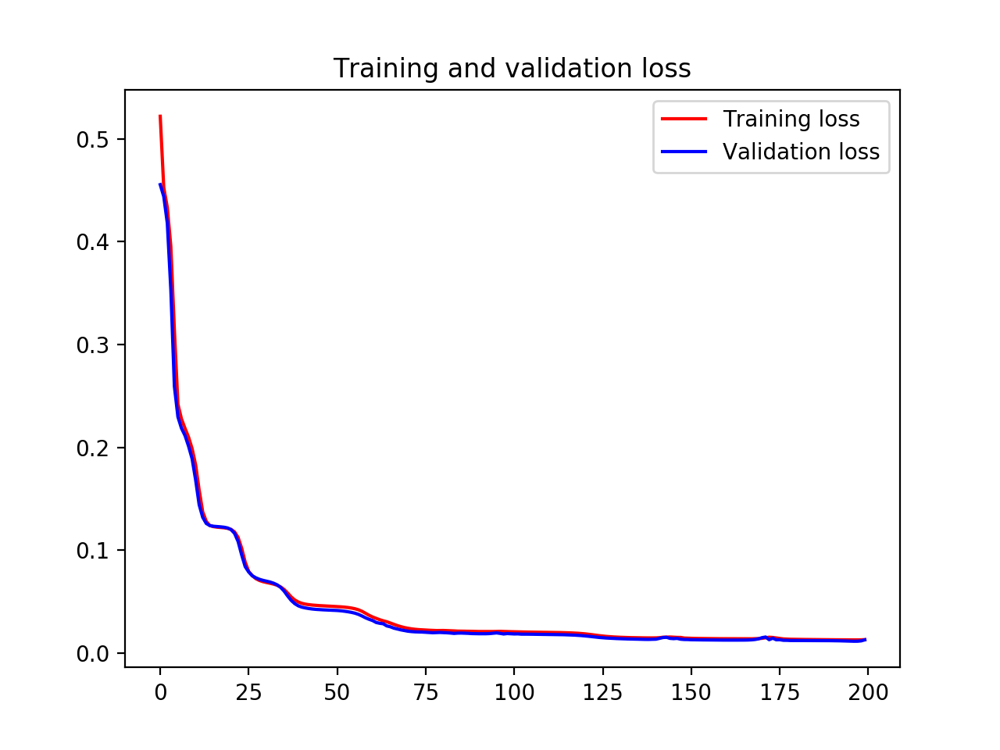

<IPython.core.display.Javascript object>


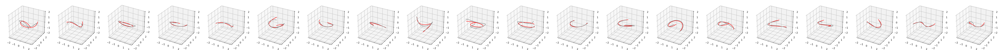

In [9]:
def autoEncoderSig():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='sigmoid')(x)
    encoded=Dense(100, activation='sigmoid')(x)

    # Decoding
    x=Dense(200, activation='sigmoid')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderSig, encoderSig=autoEncoderSig()
testAutoEncoder(autoencoderSig, encoderSig, x_train, x_test, 200)

## 1.2 Autoencoder RELU activation

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_7 (Dense)              (None, 200)               60200     
_________________________________________________________________
dense_8 (Dense)              (None, 100)               20100     
_________________________________________________________________
dense_9 (Dense)              (None, 200)               20200     
_________________________________________________________________
dense_10 (Dense)             (None, 300)               60300     
__________

<IPython.core.display.Javascript object>


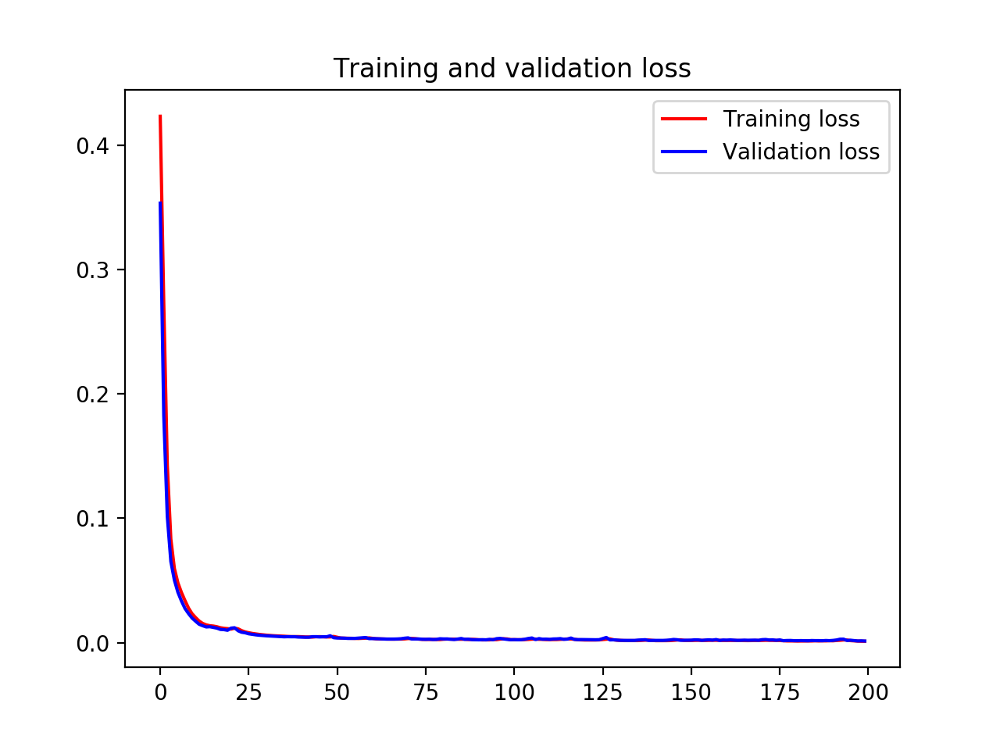

<IPython.core.display.Javascript object>


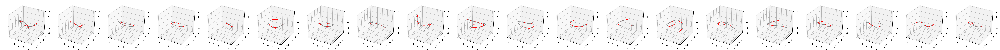

In [10]:
def autoEncoderRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='sigmoid')(x)
    x=Dense(200, activation='relu')(x)
    encoded=Dense(100, activation='relu')(x)

    # Decoding
    x=Dense(200, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderRELU, encoderRELU=autoEncoderRELU()
testAutoEncoder(autoencoderRELU, encoderRELU, x_train, x_test, 200)

## 1.3 Autoencoder LeakyRELU activation

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 300)               90300     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 300)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 200)               60200     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 200)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 100)               20100     
__________

<IPython.core.display.Javascript object>


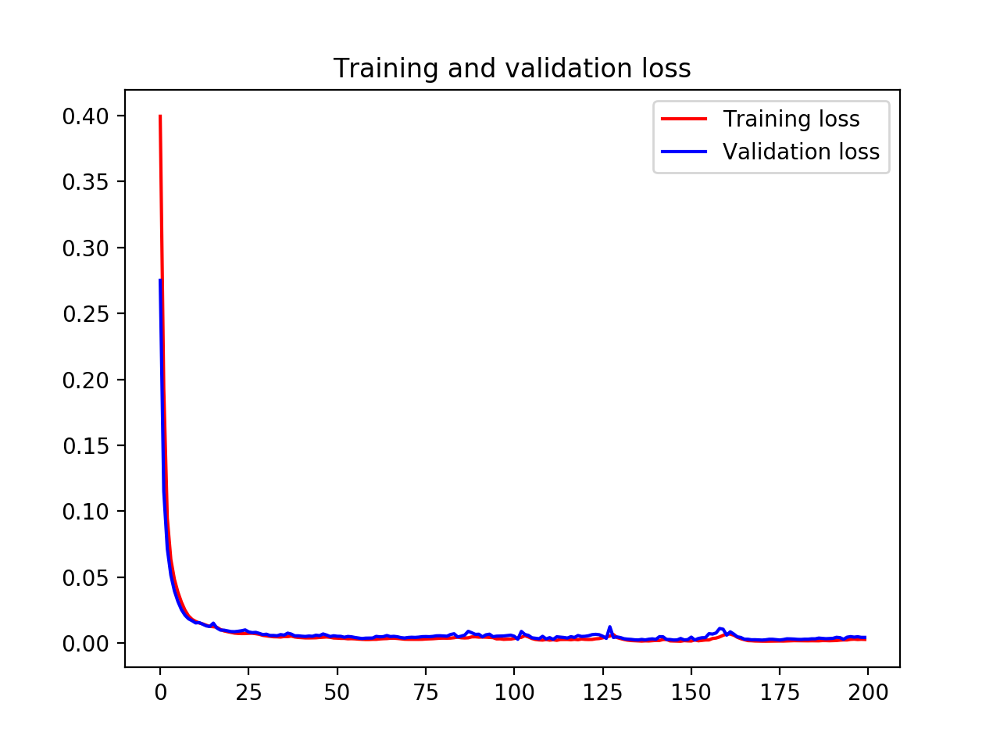

<IPython.core.display.Javascript object>


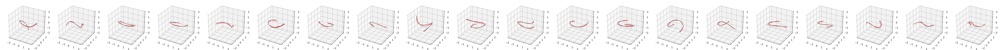

In [11]:
def autoEncoderLRELU():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(200)(x)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(100)(x)
    encoded=LeakyReLU(alpha=0.01)(x)

    # Decoding
    x=Dense(200)(encoded)
    x=LeakyReLU(alpha=0.01)(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderLRELU, encoderLRELU=autoEncoderLRELU()
testAutoEncoder(autoencoderLRELU, encoderLRELU, x_train, x_test, 200)

# 2. Effect of Latent space Z=2,3,10,15,30,60,300 on Dense Auto-Encoders

The nodes in Z-space determines the dimensionity reduction carried out by an auto-encoder. However, if the z-space is too small, the accuracy of reconstruction is adversely affected. Thus, we carry an emperical analysis to find the best accuracy-dimentionality tradeoff.

| Z-Space Dimension   | Final Training Loss | Final Validation Loss | 
| ------------------- |:-------------------:| ---------------------:| 
| 2                   | 0.0359              | 0.0399                | 
| 3                   | 0.0285              | 0.0382                | 
| 10                  | 0.0098              | 0.0146                | 
| 15                  | 0.0072              | 0.0120                | 
| 30                  | 0.0035              | 0.0059                | 
| 60                  | 0.0017              | 0.0029                |
| 300                 | 0.0009              | 0.0016                | 

## 2.1 Autoencoder Z=2

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_16 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_17 (Dense)             (None, 30)                3030      
_________________________________________________________________
dense_18 (Dense)             (None, 20)                620       
_________________________________________________________________
dense_19 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_20 (Dense)             (None, 5)                 55        
__________

<IPython.core.display.Javascript object>


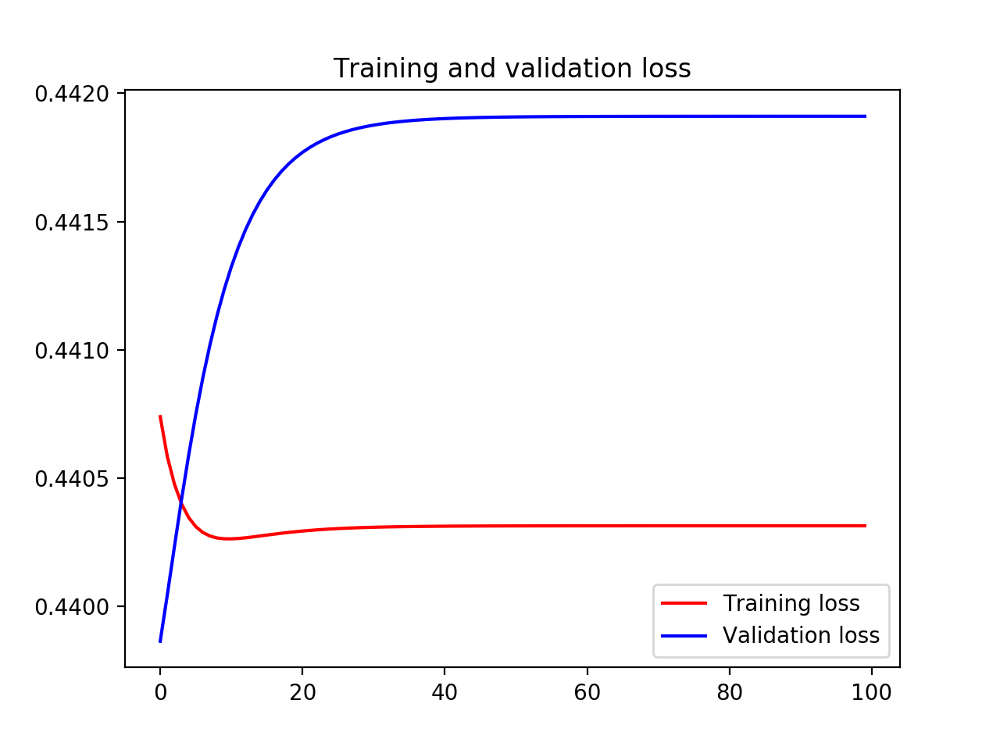

<IPython.core.display.Javascript object>


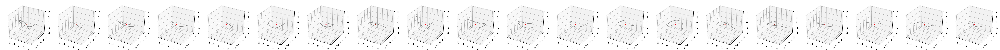

In [12]:
def autoEncoderZ2():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    x=Dense(5, activation='relu')(x)
    encoded=Dense(2, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(5, activation='relu')(encoded)
    x=Dense(10, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ2, encoderZ2=autoEncoderZ2()
testAutoEncoder(autoencoderZ2, encoderZ2, x_train, x_test, 100)

## 2.2 Autoencoder Z=3

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_28 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_29 (Dense)             (None, 30)                3030      
_________________________________________________________________
dense_30 (Dense)             (None, 20)                620       
_________________________________________________________________
dense_31 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_32 (Dense)             (None, 3)                 33        
__________

<IPython.core.display.Javascript object>


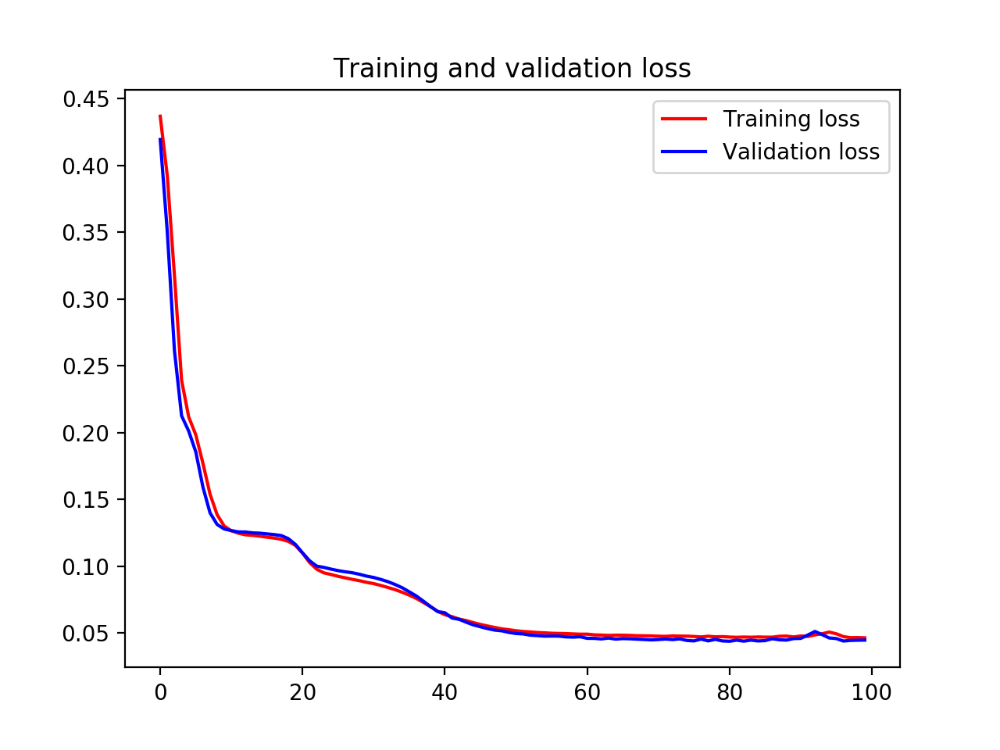

<IPython.core.display.Javascript object>


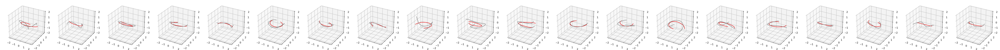

In [13]:
def autoEncoderZ3():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(20, activation='relu')(x)
    x=Dense(10, activation='relu')(x)
    encoded=Dense(3, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(10, activation='relu')(encoded)
    x=Dense(20, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ3, encoderZ3=autoEncoderZ3()
testAutoEncoder(autoencoderZ3, encoderZ3, x_train, x_test, 100)

## 2.3 Autoencoder Z=10

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_38 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_39 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_40 (Dense)             (None, 25)                1275      
_________________________________________________________________
dense_41 (Dense)             (None, 10)                260       
_________________________________________________________________
dense_42 (Dense)             (None, 25)                275       
__________

<IPython.core.display.Javascript object>


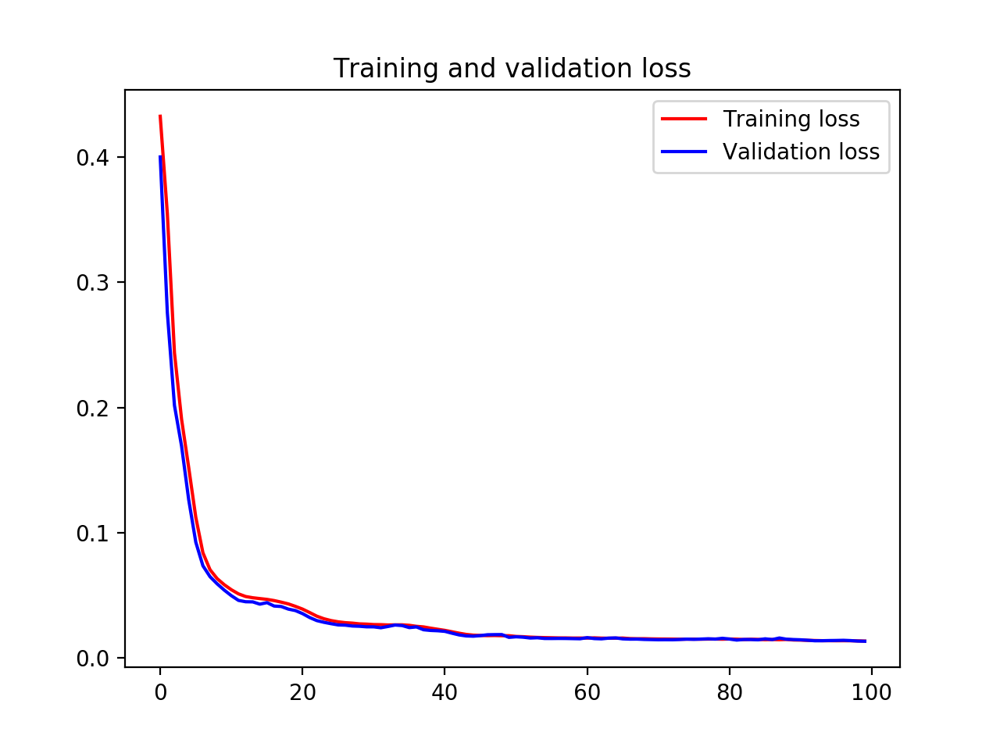

<IPython.core.display.Javascript object>


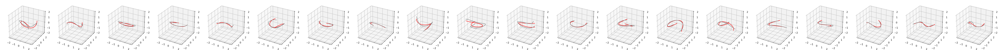

In [14]:
def autoEncoderZ10():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(50, activation='relu')(x)
    x=Dense(25, activation='relu')(x)
    encoded=Dense(10, activation='relu')(x)

    # Decoding
    x=Dense(25, activation='relu')(encoded)
    x=Dense(50, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ10, encoderZ10=autoEncoderZ10()
testAutoEncoder(autoencoderZ10, encoderZ10, x_train, x_test, 100)

## 2.4 Autoencoder Z=15

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_46 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_47 (Dense)             (None, 60)                6060      
_________________________________________________________________
dense_48 (Dense)             (None, 30)                1830      
_________________________________________________________________
dense_49 (Dense)             (None, 15)                465       
_________________________________________________________________
dense_50 (Dense)             (None, 30)                480       
__________

<IPython.core.display.Javascript object>


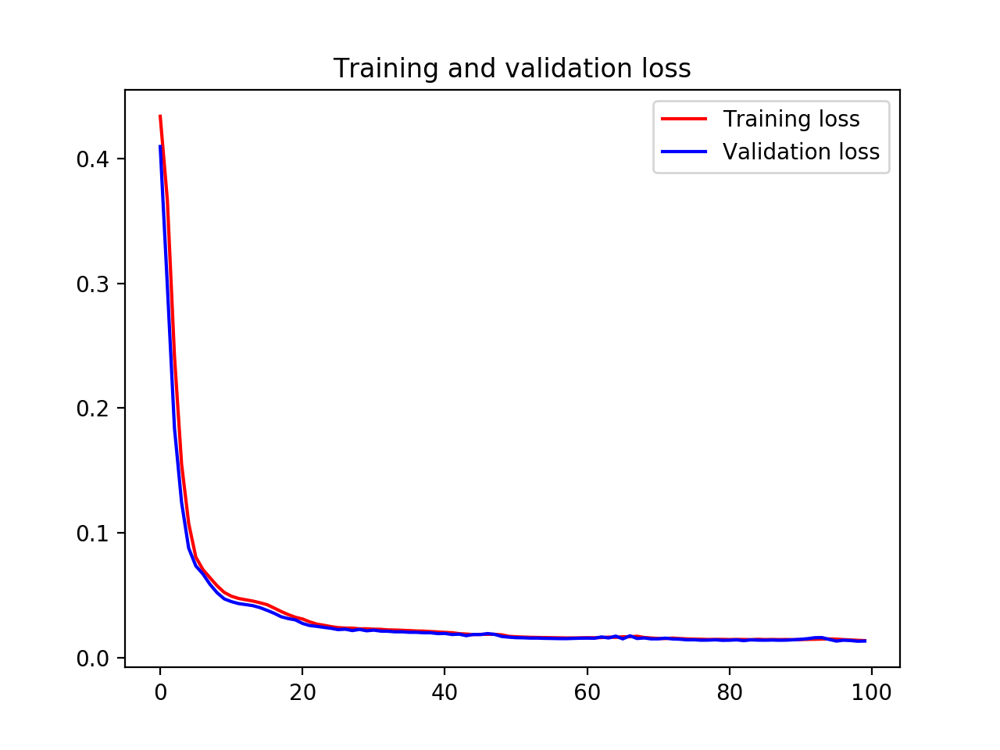

<IPython.core.display.Javascript object>


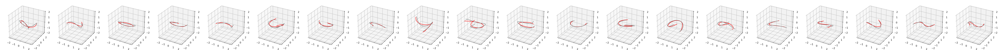

In [15]:
def autoEncoderZ15():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    encoded=Dense(15, activation='relu')(x)

    # Decoding
    x=Dense(30, activation='relu')(encoded)
    x=Dense(60, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ15, encoderZ15=autoEncoderZ15()
testAutoEncoder(autoencoderZ15, encoderZ15, x_train, x_test, 100)

## 2.5 Autoencoder Z=30

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_54 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_55 (Dense)             (None, 60)                6060      
_________________________________________________________________
dense_56 (Dense)             (None, 30)                1830      
_________________________________________________________________
dense_57 (Dense)             (None, 60)                1860      
_________________________________________________________________
dense_58 (Dense)             (None, 100)               6100      
__________

<IPython.core.display.Javascript object>


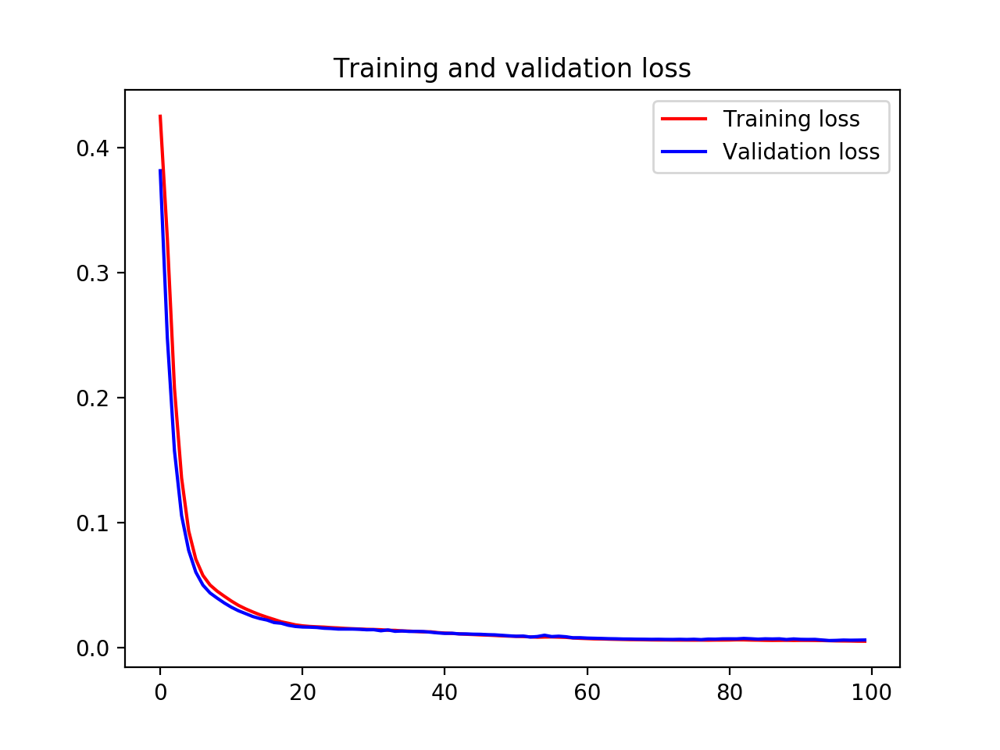

<IPython.core.display.Javascript object>


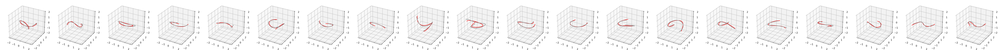

In [16]:
def autoEncoderZ30():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    encoded=Dense(30, activation='relu')(x)

    # Decoding
    x=Dense(60, activation='relu')(encoded)
    x=Dense(100, activation='relu')(x)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ30, encoderZ30=autoEncoderZ30()
testAutoEncoder(autoencoderZ30, encoderZ30, x_train, x_test, 100)

## 2.6 Autoencoder Z=60

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 100, 3)            0         
_________________________________________________________________
flatten_9 (Flatten)          (None, 300)               0         
_________________________________________________________________
dense_60 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_61 (Dense)             (None, 60)                6060      
_________________________________________________________________
dense_62 (Dense)             (None, 100)               6100      
_________________________________________________________________
dense_63 (Dense)             (None, 300)               30300     
_________________________________________________________________
reshape_9 (Reshape)          (None, 100, 3)            0         
Total para

<IPython.core.display.Javascript object>


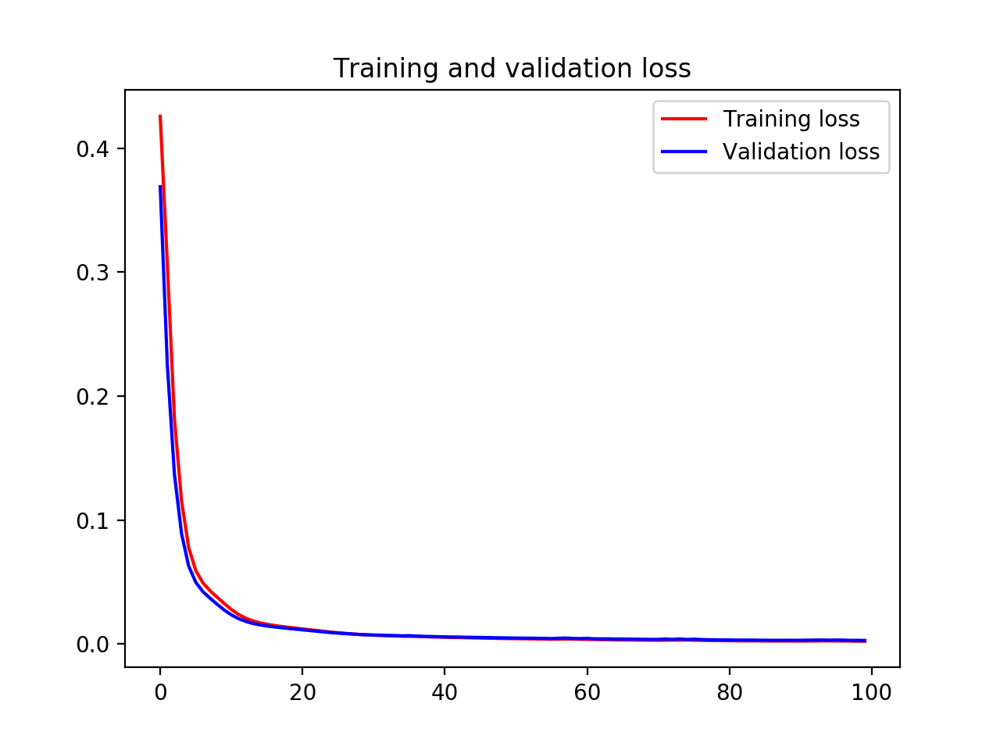

<IPython.core.display.Javascript object>


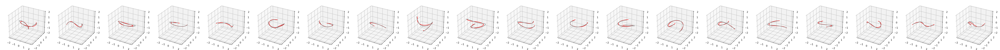

In [17]:
def autoEncoderZ60():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(100, activation='relu')(x)
    encoded=Dense(60, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(100, activation='relu')(encoded)
    x=Dense(300)(x)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ60, encoderZ60=autoEncoderZ60()
testAutoEncoder(autoencoderZ60, encoderZ60, x_train, x_test, 100)

## 2.7 AutoEncoder Z=300

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 100, 3)            0         
_________________________________________________________________
flatten_10 (Flatten)         (None, 300)               0         
_________________________________________________________________
dense_64 (Dense)             (None, 300)               90300     
_________________________________________________________________
dense_65 (Dense)             (None, 300)               90300     
_________________________________________________________________
dense_66 (Dense)             (None, 300)               90300     
_________________________________________________________________
reshape_10 (Reshape)         (None, 100, 3)            0         
Total params: 270,900
Trainable params: 270,900
Non-trainable params: 0
_________________________________________________________________
Fina

<IPython.core.display.Javascript object>


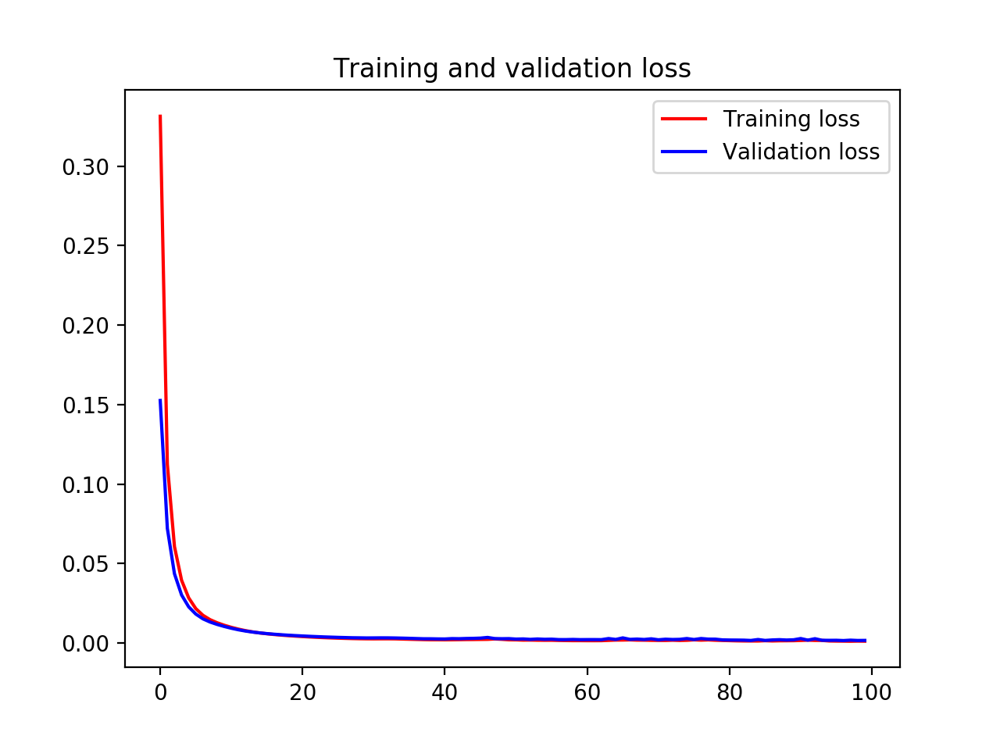

<IPython.core.display.Javascript object>


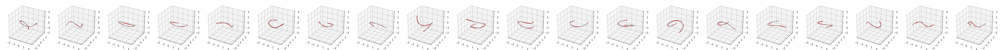

In [18]:
def autoEncoderZ300():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x=Flatten()(inp_curve)
    x=Dense(300, activation='relu')(x)
    encoded=Dense(300, activation='relu')(x)
    #encoded=Dense(10, activation='relu',activity_regularizer=regularizers.l1(10e-5))(x)

    # Decoding
    x=Dense(300)(encoded)
    decoded=Reshape((100, 3))(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

#resetRNG(0)
autoencoderZ300, encoderZ300=autoEncoderZ300()
testAutoEncoder(autoencoderZ300, encoderZ300, x_train, x_test, 100)

# 3. Convolutional Autoencoders

## Convolution (Normal) AutoEncoder Z=10

## Convolution (Spatial Separable) AutoEncoder Z=10


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
separable_conv1d_1 (SeparableCo (None, 100, 4)       31          input_11[0][0]                   
__________________________________________________________________________________________________
separable_conv1d_2 (SeparableCo (None, 100, 4)       76          input_11[0][0]                   
__________________________________________________________________________________________________
separable_conv1d_3 (SeparableCo (None, 100, 4)       166         input_11[0][0]                   
__________________________________________________________________________________________________
max_pooli

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


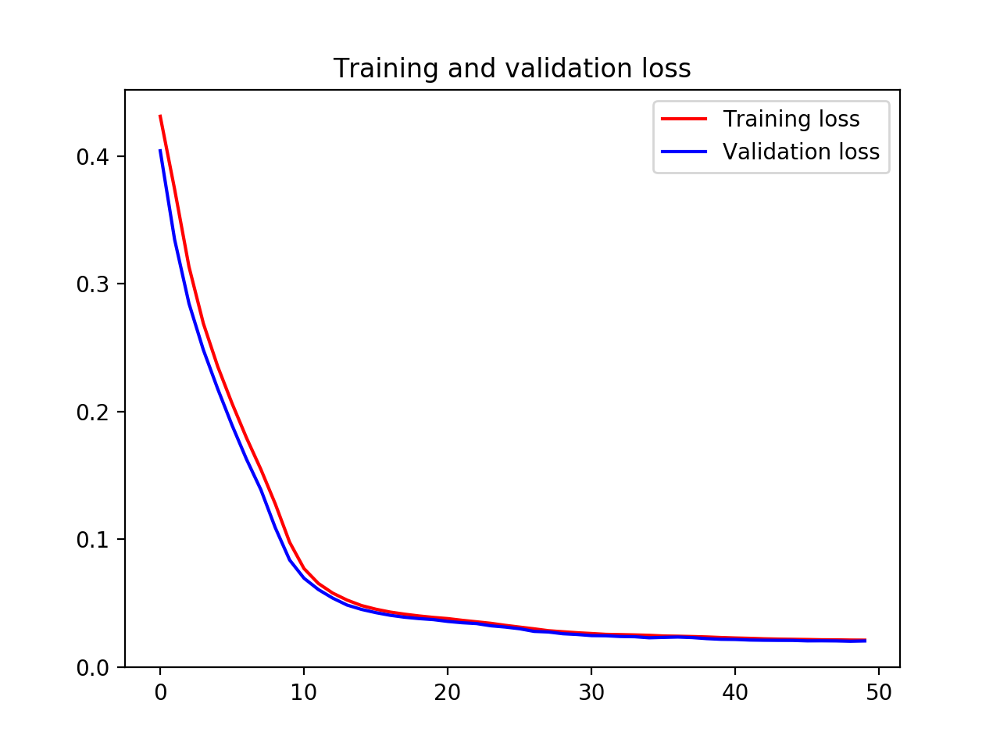

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


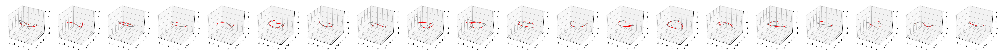

In [19]:
from keras.layers import Lambda, Add, MaxPooling1D, UpSampling1D

def autoEncoderCov1DZ10():
    inp_curve=Input(shape=(100,3,))

    # Encoding
    x1=SeparableConv1D(4,5,padding='same')(inp_curve)
    x1=MaxPooling1D(2)(x1)
    x1=Flatten()(x1)
    x2=SeparableConv1D(4,20,padding='same')(inp_curve)
    x2=MaxPooling1D(2)(x2)
    x2=Flatten()(x2)
    x3=SeparableConv1D(4,50,padding='same')(inp_curve)
    x3=MaxPooling1D(2)(x3)
    x3=Flatten()(x3)
    x=concatenate([x1,x2,x3], axis=1)
    x=Dense(100, activation='relu')(x)
    x=Dense(30, activation='relu')(x)
    encoded=Dense(10, activation='relu')(x)

    # Decoding
    x=Dense(30, activation='relu')(encoded)
    x=Dense(100, activation='relu')(x)
    x=Dense(600, activation='relu')(x)
    x1=Lambda(lambda x: x[:,0:50*4])(x)
    x1=UpSampling1D(2)(x1)
    x1=Reshape((100, 4))(x1)
    x1=SeparableConv1D(4,5,padding='same')(x1)
    x2=Lambda(lambda x: x[:,50*4:2*50*4])(x)
    x2=UpSampling1D(2)(x2)
    x2=Reshape((100, 4))(x2)
    x2=SeparableConv1D(4,5,padding='same')(x2)
    x3=Lambda(lambda x: x[:,2*50*4:3*50*4])(x)
    x3=UpSampling1D(2)(x3)
    x3=Reshape((100, 4))(x3)
    x3=SeparableConv1D(4,5,padding='same')(x3)
    x=Add()([x1, x2, x3])
    decoded=SeparableConv1D(3,5,padding='same')(x)

    autoencoder = Model(inp_curve, decoded)
    encoder = Model(inp_curve, encoded)
    autoencoder.summary()
    
    return autoencoder, encoder

autoencoderZ10C1D, encoderZ10C1D=autoEncoderCov1DZ10()
testAutoEncoder(autoencoderZ10C1D, encoderZ10C1D, x_train, x_test)

## Convolution (with FFT) AutoEncoder Z=10

## Variational Autoencoder Z=10

# Perform Hierarchical Clustering (K-Mean)(also try Dendrogram)

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


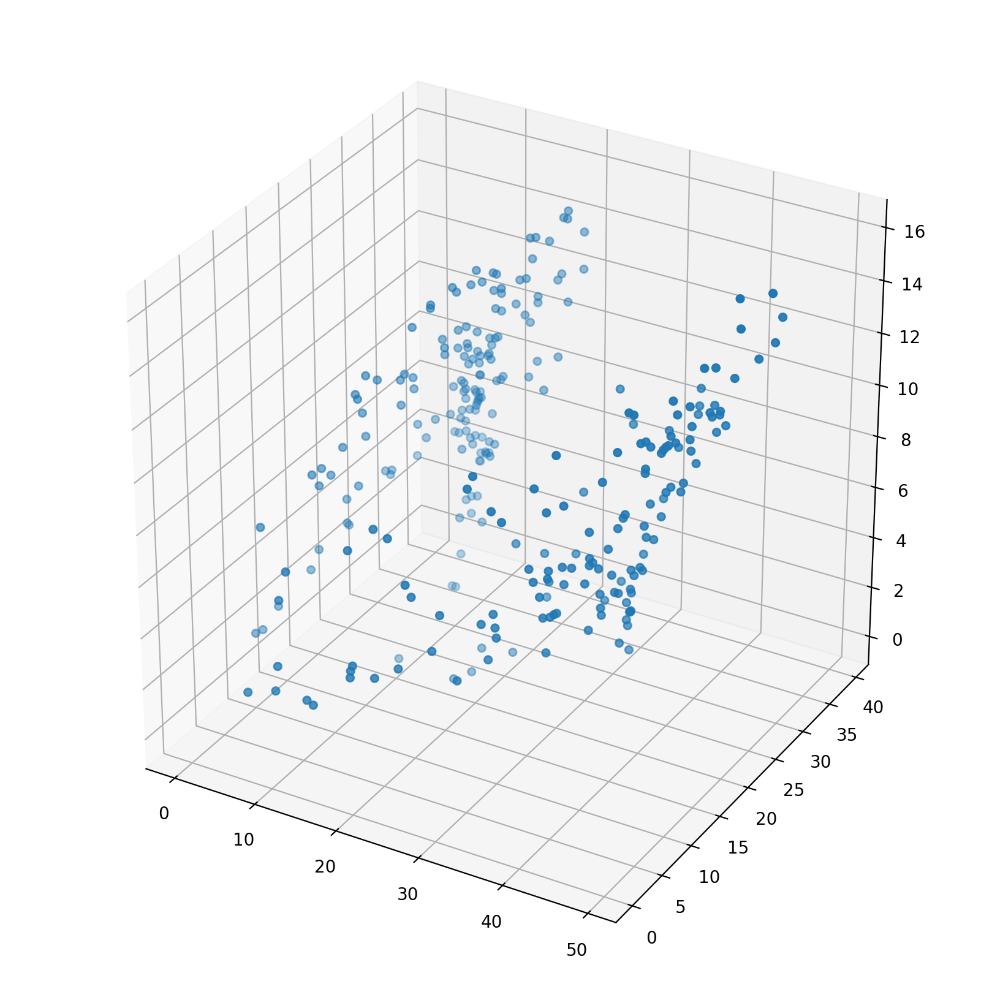

In [20]:
z_param = encoderZ3.predict(x_test)
#print(z_param)

fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(z_param[:,0],z_param[:,1],z_param[:,2])

plt.tight_layout()
plt.show()

In [21]:
from sklearn.cluster import KMeans

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


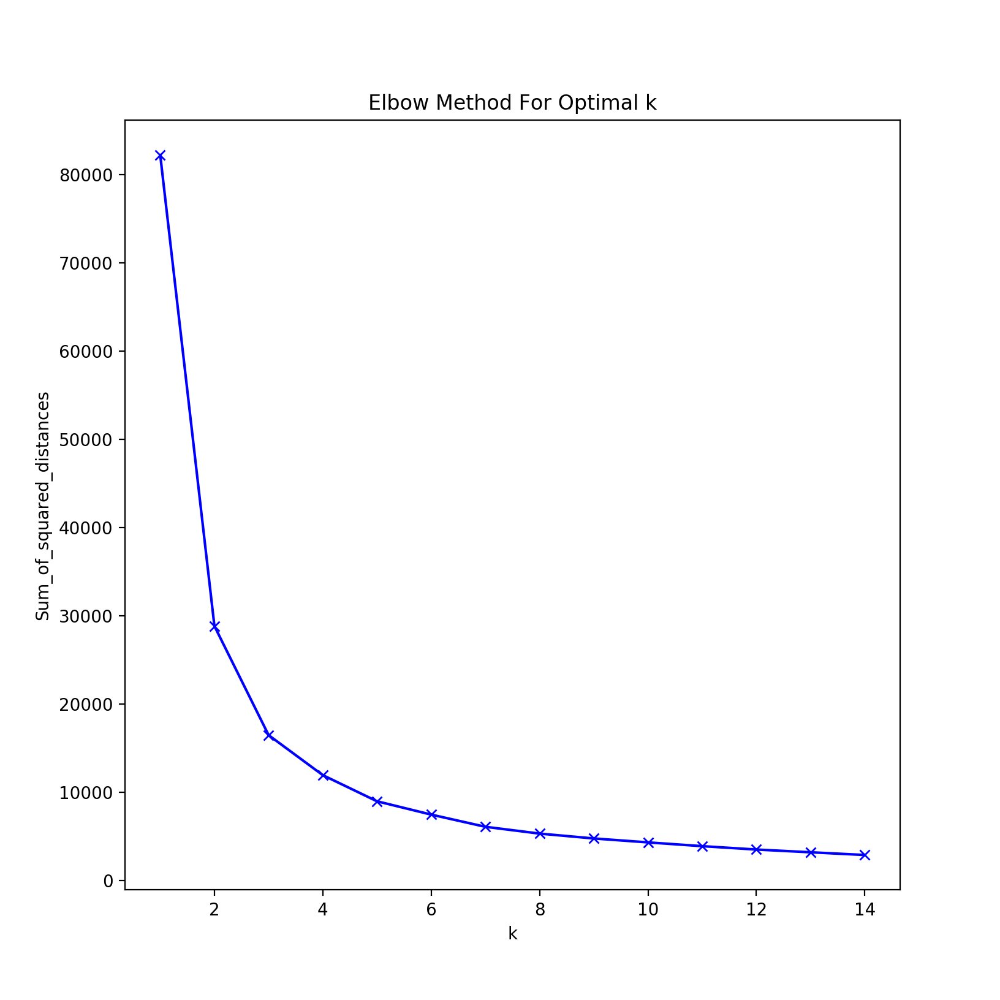

In [22]:
#Find optimal K-value using the elbow method
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(z_param)
    Sum_of_squared_distances.append(km.inertia_)

fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

C:\Users\sshel\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


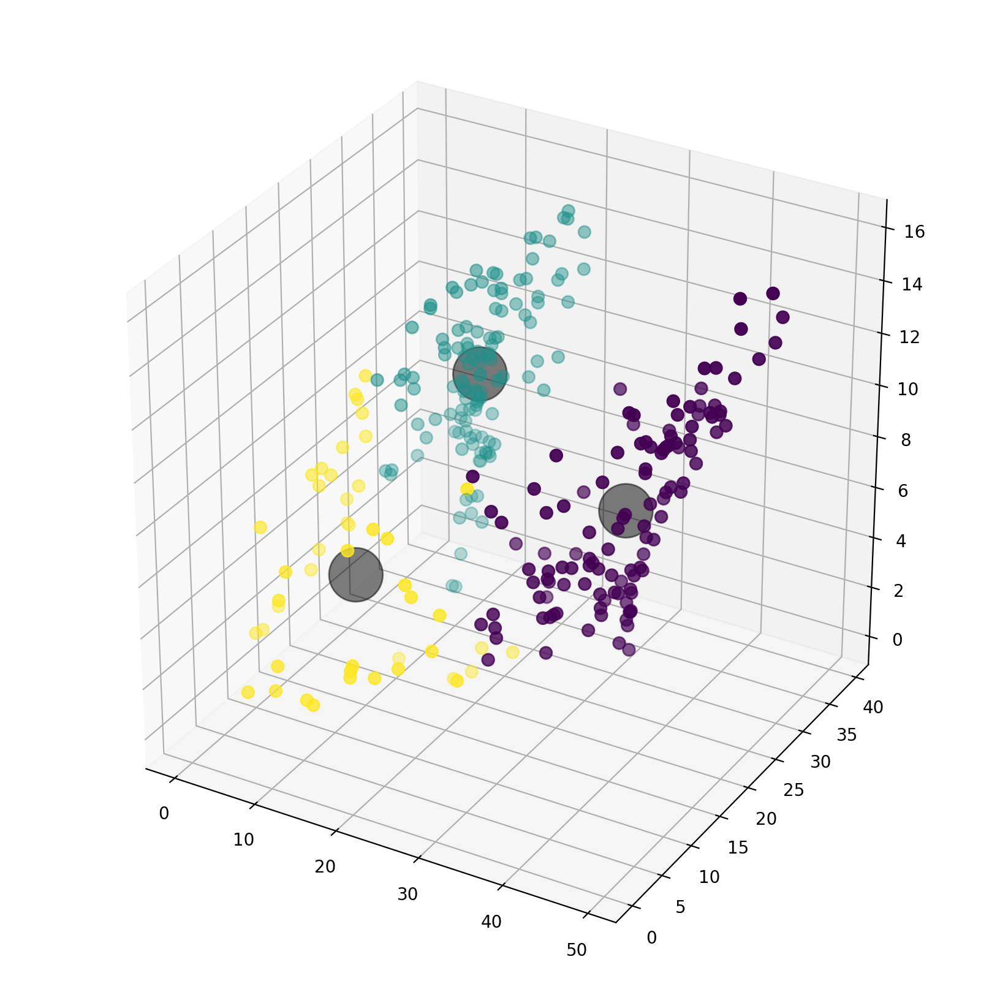

In [23]:
optK=3
kmeans = KMeans(n_clusters=optK)
kmeans.fit(z_param)
y_kmeans = kmeans.predict(z_param)

centers = kmeans.cluster_centers_
fig = plt.figure(figsize=1.7*plt.figaspect(1))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(z_param[:, 0], z_param[:, 1], z_param[:, 2], c=y_kmeans, s=50, cmap='viridis')
ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], c='black', s=1000, alpha=0.5);

plt.tight_layout()

# Find similar paths using KNN on Cluster Centers